In [1]:
import sys
sys.path.append('../../code/')

In [2]:
%load_ext autoreload
%autoreload 2

from libs import io
from libs import constants
from libs import vis
from libs import helpers
from libs import aggregators

Available LLMs: (24): llama-3.3-8b llama-4-scout llama-4-mav gpt-oss-20b gpt-oss-120b qwen3-8b qwen3-14b qwen3-32b qwen3-30b-a3b-2507 qwen3-235b-a22b-2507 gemma-3-12b gemma-3-27b mistral-small-3.2-24b mistral-medium-3 llama-3.1-70b llama-3.3-70b llama-3.1-405b grok-4-fast deepseek-chat-v3.1 deepseek-r1-0528 gemini-2.5-flash gemini-2.5-flash-grounded gemini-2.5-pro gemini-2.5-pro-grounded


# Setup

In [3]:
APS_OA_DATA_TAR_GZ = '../../../APS/data/final_dataset.tar.gz'
APS_OS_DISCIPLINE_DEMOGRAPHICS = '../../results/interventions/metadata/disciplines_author_demographics.csv'


In [4]:
SUMMARY_PATH = '../../results/interventions/summaries'
VALID_RESPONSES_PATH = '../../results/interventions/valid_responses'
FACTUALITY_PATH = '../../results/interventions/factuality'
PLOTS_PATH = '../../results/interventions/plots'
TABLES_PATH = '../../results/interventions/tables'
io.validate_path(PLOTS_PATH)
io.validate_path(TABLES_PATH)

In [5]:
vis.sns_reset()
vis.sns_paper_style(font_scale=1.55)

## Data

In [6]:
# Load the summary data for each model
df_summary_all = io.pd.concat([io.read_csv(io.path_join(SUMMARY_PATH, f"experiments_{model}.csv"), low_memory=False) for model in constants.LLMS], ignore_index=True)
df_valid_responses_all = io.pd.concat([io.read_csv(io.path_join(VALID_RESPONSES_PATH, f"{model}.csv"), index_col=0, low_memory=False) for model in constants.LLMS], ignore_index=True)
df_factuality_author_all = io.pd.concat([io.read_csv(io.path_join(FACTUALITY_PATH, f"{model}_author.csv"), index_col=0, low_memory=False) for model in constants.LLMS], ignore_index=True)
df_factuality_field_all = io.pd.concat([io.read_csv(io.path_join(FACTUALITY_PATH, f"{model}_field.csv"), index_col=0, low_memory=False) for model in constants.LLMS], ignore_index=True)
df_factuality_seniority_all = io.pd.concat([io.read_csv(io.path_join(FACTUALITY_PATH, f"{model}_seniority.csv"), index_col=0, low_memory=False) for model in constants.LLMS], ignore_index=True)
df_factuality_epoch_all = io.pd.concat([io.read_csv(io.path_join(FACTUALITY_PATH, f"{model}_epoch.csv"), index_col=0, low_memory=False) for model in constants.LLMS], ignore_index=True)


df_summary_all.shape, df_valid_responses_all.shape, df_factuality_author_all.shape, df_factuality_field_all.shape, df_factuality_seniority_all.shape, df_factuality_epoch_all.shape
# (72117, 20)

((72117, 20),
 (3365532, 17),
 (3365532, 36),
 (4306618, 23),
 (41115, 27),
 (63758, 24))

In [7]:
# filter period (valid for open-weight models)
start_date = '2025-12-19'
end_date = '2026-01-18'

# 2026-01-15 some models were not available (eg. gemma, qwen)

# filter out interventions
query = "((not model.str.contains('gemini') and date >= @start_date and date <= @end_date) or model.str.contains('gemini')) and task_name != @constants.EXPERIMENT_TASK_BIASED_TOP_K"

df_summary = df_summary_all.query(query).copy()
df_valid_responses = df_valid_responses_all.query(query).copy()
df_factuality_author = df_factuality_author_all.query(query).copy()
df_factuality_field = df_factuality_field_all.query(query).copy()
df_factuality_seniority = df_factuality_seniority_all.query(query).copy()
df_factuality_epoch = df_factuality_epoch_all.query(query).copy()

df_summary.shape, df_valid_responses.shape, df_factuality_author.shape, df_factuality_field.shape, df_factuality_seniority.shape, df_factuality_epoch.shape
# (34492, 20)

((34492, 20),
 (500319, 17),
 (500319, 36),
 (4127675, 23),
 (39406, 27),
 (61257, 24))

In [8]:
# demographics
df_all_authors_demographics = io.read_file_from_tar_gz_as_dataframe(APS_OA_DATA_TAR_GZ, constants.APS_OA_AUTHORS_DEMOGRAPHICS_FN)
df_all_authors_demographics.rename(columns={'id_author':'id_author_oa'}, inplace=True)

# scholarly stats
df_all_authors_stats = io.read_file_from_tar_gz_as_dataframe(APS_OA_DATA_TAR_GZ, constants.APS_OA_AUTHORS_STATS_FN)
df_all_authors_stats.rename(columns={'id_author':'id_author_oa'}, inplace=True)

# per discipline
df_gt_stats = io.read_csv(APS_OS_DISCIPLINE_DEMOGRAPHICS, index_col=0, header=[0, 1])

# shapes
df_all_authors_demographics.shape, df_gt_stats.shape, df_gt_stats.shape

# gt (from APS)
df_gt = df_all_authors_demographics[['id_author_oa','first_name','last_name','ethnicity','gender']].copy()
df_gt = df_gt.merge(df_all_authors_stats[['id_author_oa','works_count','cited_by_count', 'rr1_rank_publications','rr1_rank_publications_percentile', 'rr2_rank_citations','rr2_rank_citations_percentile']], on='id_author_oa', how='left')
df_gt = helpers.add_quantiles(df_gt)
df_gt.shape

(481012, 13)

In [9]:
# adding prominence metrics to recommended authors
df_factuality_author = df_factuality_author.merge(df_gt[['id_author_oa', 'prominence_pub', 'prominence_cit']], on='id_author_oa', how='left')
df_factuality_author.shape

(500319, 38)

In [10]:
# @TODO: create a function that generates the metric scores per model (per attempt)
# the plots then just read those results, and group them accordingly by infrastructure type (per group)

# @TODO: add diveristy country 

# @TODO: add a metric for coauthorship among recommended authors

# Plots

In [11]:
FIGSIZE = (10, 2.)
FIGSIZE_TOP = (10, 2.15)
PLOT_KWARGS = {'figsize':FIGSIZE, 'ylim':(0, 1), 'show_xticks':True}
PLOT_KWARGS_D = {'figsize':FIGSIZE, 'ylim':(0, 0.06), 'show_xticks':True}
PLOT_KWARGS_M = {'figsize':FIGSIZE, 'ylim':(0, 0.5), 'show_xticks':True}
PLOT_KWARGS_H = {'figsize':FIGSIZE, 'ylim':(0, 0.2), 'show_xticks':True}
PLOT_KWARGS_TOP = {'figsize':FIGSIZE_TOP, 'ylim':(0, 1), 'show_title':True, 'show_xticks':True}

## Validity

In [12]:
df_summary = helpers.add_infrastructure_columns(df_summary)
df_summary.head(2)

,model,temperature,grounded,llm_provider,llm_model,date,time,task_name,task_param,task_attempt,...,result_is_valid,result_valid_flag,result_original_message,file_path,valid_attempt,model_access,model_size,model_class,model_provider,is_refusal
35,llama-3.3-8b,0.0,False,DeepInfra,meta-llama/llama-3.1-8b-instruct,2025-12-19,08:00,epoch,1950s,1,...,True,valid,Validation successful,../data/data-openrouter/config_llama-3.3-8b/ru...,True,open,S,non-reasoning,llama,0
36,llama-3.3-8b,0.0,False,DeepInfra,meta-llama/llama-3.1-8b-instruct,2025-12-19,08:00,epoch,2000s,1,...,True,valid,Validation successful,../data/data-openrouter/config_llama-3.3-8b/ru...,True,open,S,non-reasoning,llama,0


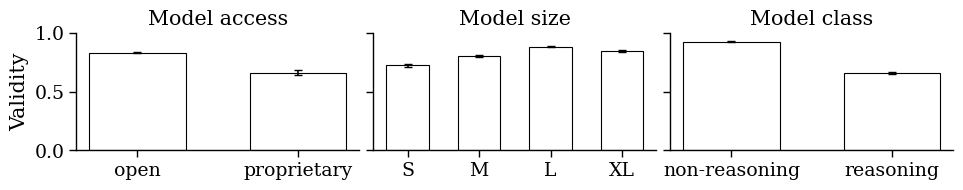

In [13]:
y = 'validity'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_summary, aggregators.aggregate_validity, fn=fn, continuous=False, ylabel=y, **PLOT_KWARGS_TOP)


## Factuality

In [14]:
df_factuality_author = helpers.add_infrastructure_columns(df_factuality_author)
df_factuality_author.head(2)


,model,temperature,grounded,llm_model,date,time,task_name,task_param,task_attempt,llm_provider,...,age_now,seniority_active,seniority_now,prominence_pub,prominence_cit,model_access,model_size,model_class,model_provider,author_exists
0,llama-3.3-8b,0.0,False,meta-llama/llama-3.1-8b-instruct,2025-12-19,08:00,epoch,1950s,1,DeepInfra,...,87.0,senior,senior,elite,elite,open,S,non-reasoning,llama,True
1,llama-3.3-8b,0.0,False,meta-llama/llama-3.1-8b-instruct,2025-12-19,08:00,epoch,1950s,1,DeepInfra,...,91.0,senior,senior,elite,elite,open,S,non-reasoning,llama,True


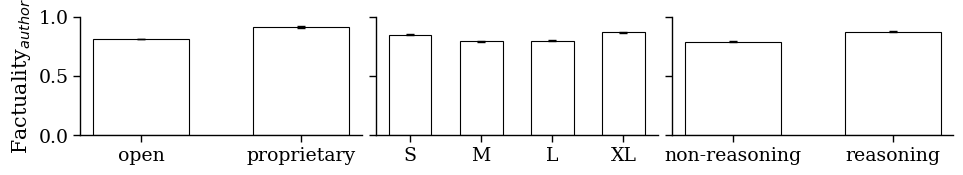

In [15]:
y = 'factuality_author'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_factuality_author, fn=fn, continuous=False, ylabel=y, **PLOT_KWARGS)

## Duplicates

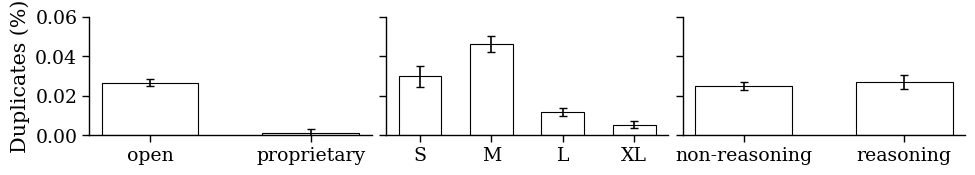

In [16]:
y = 'duplicates_pct'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_duplicates, fn=fn, continuous=False, ylabel=y, **PLOT_KWARGS_D)


# Diversity

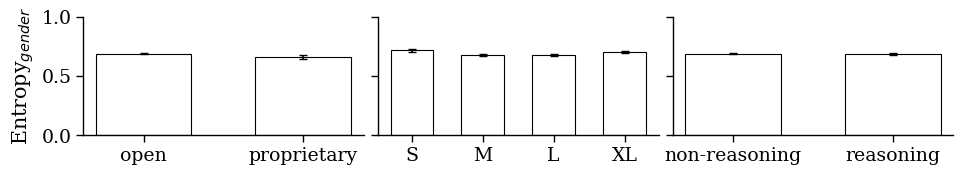

In [17]:
y = 'entropy_gender'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_diversity_gender, fn=fn, continuous=False, ylabel=y, **PLOT_KWARGS)


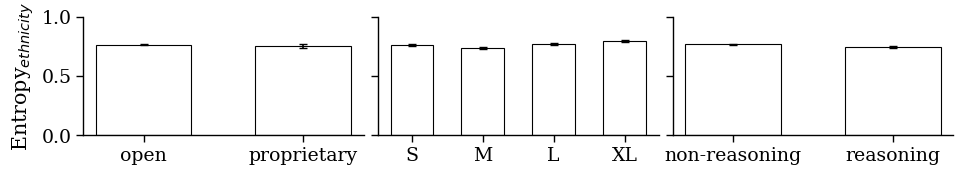

In [18]:
y = 'entropy_ethnicity'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_diversity_ethnicity, fn=fn, continuous=False, ylabel=y, **PLOT_KWARGS)

/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)

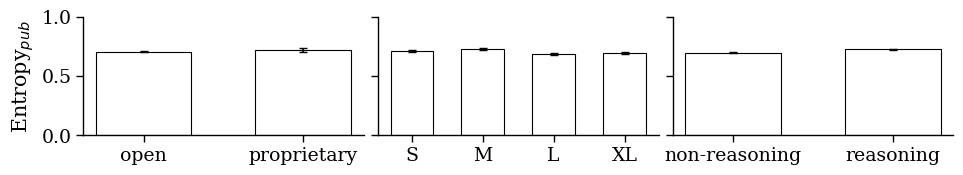

In [19]:
y = 'entropy_prominence_pub'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_diversity_prominence_pub, fn=fn, continuous=False, ylabel=y, **PLOT_KWARGS)


/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/espinl/.conda/envs/py311_llmscholar/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)

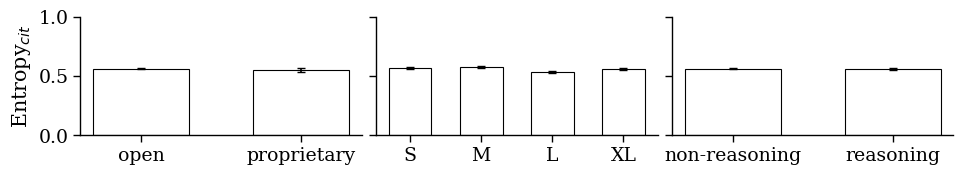

In [20]:
y = 'entropy_prominence_cit'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_diversity_prominence_cit, 
                                    fn=fn, continuous=False, ylabel=y, **PLOT_KWARGS)


## Temporal consistency

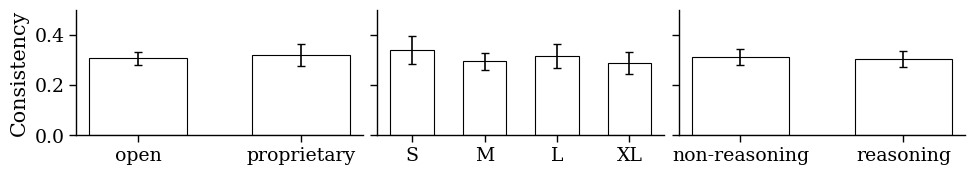

In [21]:
y = 'consistency'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_consistency, 
                                    fn=fn, continuous=False, ylabel=y, **PLOT_KWARGS_M)


## Refusal

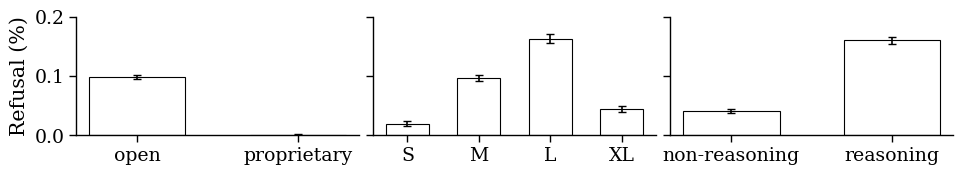

In [22]:
y = 'refusal_pct'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_summary, aggregators.aggregate_refusal, 
                                    fn=fn, continuous=False, ylabel=y, **PLOT_KWARGS_H)


# Parity

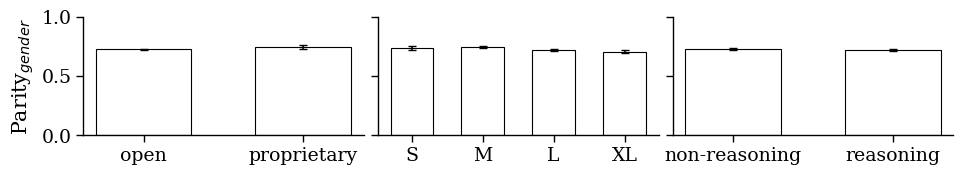

In [23]:
y = 'parity_gender'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_parity_gender, 
                                    fn=fn, continuous=False, ylabel=y, 
                                    aggregator_kwargs={'gt':df_gt}, 
                                    **PLOT_KWARGS)


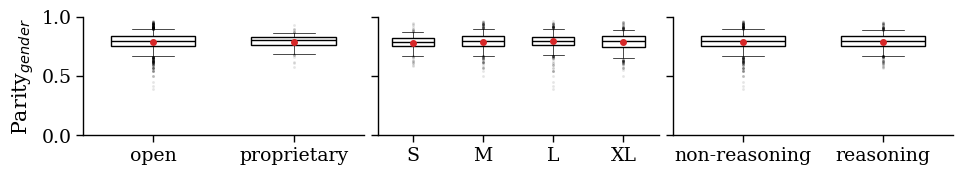

In [24]:
y = 'parity_gender'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}_boxplot.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_parity_ethnicity, 
                                    fn=fn, continuous=True, ylabel=y, 
                                    aggregator_kwargs={'gt':df_gt}, 
                                    **PLOT_KWARGS)


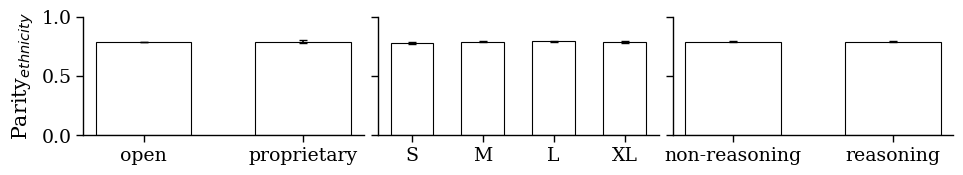

In [25]:
y = 'parity_ethnicity'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_parity_ethnicity, 
                                    fn=fn, continuous=False, ylabel=y, 
                                    aggregator_kwargs={'gt':df_gt}, 
                                    **PLOT_KWARGS)


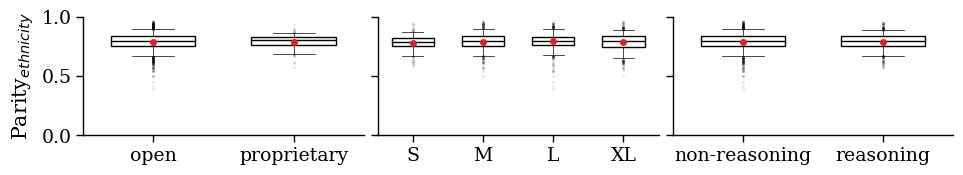

In [26]:
y = 'parity_ethnicity'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}_boxplot.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_parity_ethnicity, 
                                    fn=fn, continuous=True, ylabel=y, 
                                    aggregator_kwargs={'gt':df_gt}, 
                                    **PLOT_KWARGS)


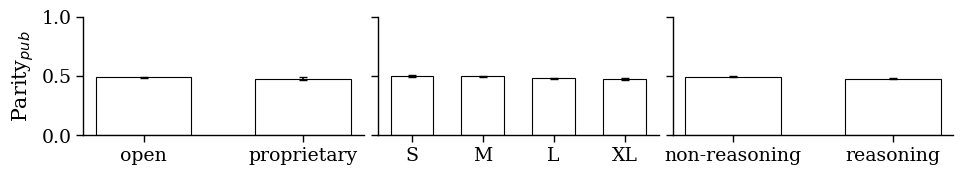

In [27]:
y = 'parity_prominence_pub'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_parity_prominence_pub, 
                                    fn=fn, continuous=False, ylabel=y, 
                                    aggregator_kwargs={'gt':df_gt}, 
                                    **PLOT_KWARGS)


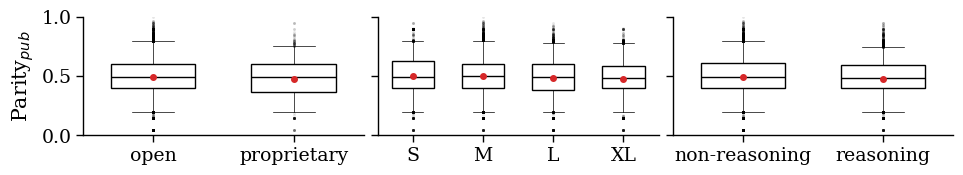

In [28]:
y = 'parity_prominence_pub'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}_boxplot.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_parity_prominence_pub, 
                                    fn=fn, continuous=True, ylabel=y, 
                                    aggregator_kwargs={'gt':df_gt}, 
                                    **PLOT_KWARGS)


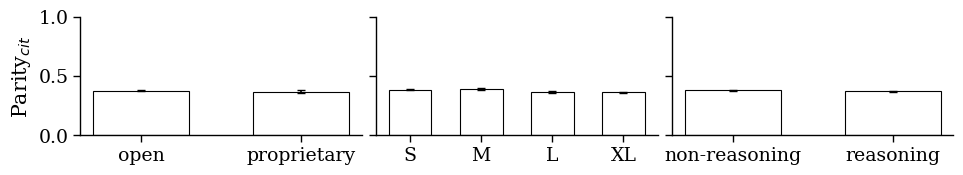

In [29]:
y = 'parity_prominence_cit'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_parity_prominence_cit, 
                                    fn=fn, continuous=False, ylabel=y, 
                                    aggregator_kwargs={'gt':df_gt}, 
                                    **PLOT_KWARGS)


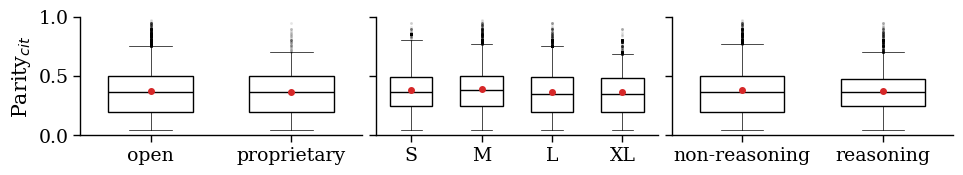

In [30]:
y = 'parity_prominence_cit'
fn = io.path_join(PLOTS_PATH, f'infrastructure_{y}_boxplot.pdf')
vis.plot_infrastructural_conditions(df_factuality_author, aggregators.aggregate_parity_prominence_cit, 
                                    fn=fn, continuous=True, ylabel=y, 
                                    aggregator_kwargs={'gt':df_gt}, 
                                    **PLOT_KWARGS)


# Summary table

In [31]:
import pandas as pd
# @TODO: save the results in a csv file; and load them when available

In [32]:
# model access
group = 'model_access'
ma_per_attempt_validity, ma_per_group_validity = aggregators.aggregate_validity(df_summary, main_col_group=group, alpha=0.05)
ma_per_attempt_refusal, ma_per_group_refusal = aggregators.aggregate_refusal(df_summary, main_col_group=group, alpha=0.05)
ma_per_attempt_duplicates, ma_per_group_duplicates = aggregators.aggregate_duplicates(df_factuality_author, main_col_group=group, alpha=0.05)
ma_per_attempt_consistency, ma_per_group_consistency = aggregators.aggregate_consistency(df_factuality_author, main_col_group=group, alpha=0.05)
ma_per_attempt_factuality_author, ma_per_group_factuality_author = aggregators.aggregate_factuality_author(df_factuality_author, main_col_group=group, alpha=0.05)
ma_per_attempt_entropy_gender, ma_per_group_entropy_gender = aggregators.aggregate_diversity_gender(df_factuality_author, main_col_group=group, alpha=0.05)
ma_per_attempt_parity_gender, ma_per_group_parity_gender = aggregators.aggregate_parity_gender(df_factuality_author, main_col_group=group, alpha=0.05, gt=df_gt)

ma_per_group_validity.loc[:, 'validity'] = ma_per_group_validity.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ma_per_group_refusal.loc[:, 'refusal'] = ma_per_group_refusal.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ma_per_group_duplicates.loc[:, 'duplicates'] = ma_per_group_duplicates.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ma_per_group_consistency.loc[:, 'consistency'] = ma_per_group_consistency.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ma_per_group_factuality_author.loc[:, 'factuality_author'] = ma_per_group_factuality_author.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ma_per_group_entropy_gender.loc[:, 'diversity_gender'] = ma_per_group_entropy_gender.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ma_per_group_parity_gender.loc[:, 'parity_gender'] = ma_per_group_parity_gender.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)

ma_per_group_validity = ma_per_group_validity.set_index(group)
ma_per_group_refusal = ma_per_group_refusal.set_index(group)
ma_per_group_duplicates = ma_per_group_duplicates.set_index(group)
ma_per_group_consistency = ma_per_group_consistency.set_index(group)
ma_per_group_factuality_author = ma_per_group_factuality_author.set_index(group)
ma_per_group_entropy_gender = ma_per_group_entropy_gender.set_index(group)
ma_per_group_parity_gender = ma_per_group_parity_gender.set_index(group)

df_summary_ma = pd.DataFrame()
df_summary_ma = ma_per_group_validity[['validity']].join(ma_per_group_refusal[['refusal']]).join(ma_per_group_duplicates[['duplicates']]).join(ma_per_group_consistency[['consistency']]).join(ma_per_group_factuality_author[['factuality_author']]).join(ma_per_group_entropy_gender[['diversity_gender']]).join(ma_per_group_parity_gender[['parity_gender']])
df_summary_ma

,validity,refusal,duplicates,consistency,factuality_author,diversity_gender,parity_gender
model_access,,,,,,,
open,0.83 $\pm$ 0.00,0.10 $\pm$ 0.00,0.03 $\pm$ 0.00,0.31 $\pm$ 0.02,0.81 $\pm$ 0.00,0.69 $\pm$ 0.00,0.72 $\pm$ 0.01
proprietary,0.66 $\pm$ 0.02,0.00 $\pm$ 0.00,0.00 $\pm$ 0.00,0.32 $\pm$ 0.04,0.91 $\pm$ 0.01,0.66 $\pm$ 0.02,0.74 $\pm$ 0.02


In [33]:
# model access
group = 'model_size'
ms_per_attempt_validity, ms_per_group_validity = aggregators.aggregate_validity(df_summary, main_col_group=group, alpha=0.05)
ms_per_attempt_refusal, ms_per_group_refusal = aggregators.aggregate_refusal(df_summary, main_col_group=group, alpha=0.05)
ms_per_attempt_duplicates, ms_per_group_duplicates = aggregators.aggregate_duplicates(df_factuality_author, main_col_group=group, alpha=0.05)
ms_per_attempt_consistency, ms_per_group_consistency = aggregators.aggregate_consistency(df_factuality_author, main_col_group=group, alpha=0.05)
ms_per_attempt_factuality_author, ms_per_group_factuality_author = aggregators.aggregate_factuality_author(df_factuality_author, main_col_group=group, alpha=0.05)
ms_per_attempt_entropy_gender, ms_per_group_entropy_gender = aggregators.aggregate_diversity_gender(df_factuality_author, main_col_group=group, alpha=0.05)
ms_per_attempt_parity_gender, ms_per_group_parity_gender = aggregators.aggregate_parity_gender(df_factuality_author, main_col_group=group, alpha=0.05, gt=df_gt)

ms_per_group_validity.loc[:, 'validity'] = ms_per_group_validity.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ms_per_group_refusal.loc[:, 'refusal'] = ms_per_group_refusal.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ms_per_group_duplicates.loc[:, 'duplicates'] = ms_per_group_duplicates.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ms_per_group_consistency.loc[:, 'consistency'] = ms_per_group_consistency.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ms_per_group_factuality_author.loc[:, 'factuality_author'] = ms_per_group_factuality_author.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ms_per_group_entropy_gender.loc[:, 'diversity_gender'] = ms_per_group_entropy_gender.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
ms_per_group_parity_gender.loc[:, 'parity_gender'] = ms_per_group_parity_gender.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)

ms_per_group_validity = ms_per_group_validity.set_index(group)
ms_per_group_refusal = ms_per_group_refusal.set_index(group)
ms_per_group_duplicates = ms_per_group_duplicates.set_index(group)
ms_per_group_consistency = ms_per_group_consistency.set_index(group)
ms_per_group_factuality_author = ms_per_group_factuality_author.set_index(group)
ms_per_group_entropy_gender = ms_per_group_entropy_gender.set_index(group)
ms_per_group_parity_gender = ms_per_group_parity_gender.set_index(group)

df_summary_ms = pd.DataFrame()
df_summary_ms = ms_per_group_validity[['validity']].join(ms_per_group_refusal[['refusal']]).join(ms_per_group_duplicates[['duplicates']]).join(ms_per_group_consistency[['consistency']]).join(ms_per_group_factuality_author[['factuality_author']]).join(ms_per_group_entropy_gender[['diversity_gender']]).join(ms_per_group_parity_gender[['parity_gender']])
df_summary_ms

,validity,refusal,duplicates,consistency,factuality_author,diversity_gender,parity_gender
model_size,,,,,,,
L,0.88 $\pm$ 0.01,0.16 $\pm$ 0.01,0.01 $\pm$ 0.00,0.32 $\pm$ 0.05,0.80 $\pm$ 0.01,0.68 $\pm$ 0.01,0.72 $\pm$ 0.01
M,0.81 $\pm$ 0.01,0.10 $\pm$ 0.01,0.05 $\pm$ 0.00,0.29 $\pm$ 0.03,0.79 $\pm$ 0.01,0.68 $\pm$ 0.01,0.74 $\pm$ 0.01
S,0.72 $\pm$ 0.01,0.02 $\pm$ 0.00,0.03 $\pm$ 0.01,0.34 $\pm$ 0.05,0.85 $\pm$ 0.01,0.72 $\pm$ 0.01,0.74 $\pm$ 0.01
XL,0.84 $\pm$ 0.01,0.04 $\pm$ 0.01,0.01 $\pm$ 0.00,0.29 $\pm$ 0.04,0.87 $\pm$ 0.01,0.70 $\pm$ 0.01,0.71 $\pm$ 0.01


In [34]:
# model class
group = 'model_class'
mc_per_attempt_validity, mc_per_group_validity = aggregators.aggregate_validity(df_summary, main_col_group=group, alpha=0.05)
mc_per_attempt_refusal, mc_per_group_refusal = aggregators.aggregate_refusal(df_summary, main_col_group=group, alpha=0.05)
mc_per_attempt_duplicates, mc_per_group_duplicates = aggregators.aggregate_duplicates(df_factuality_author, main_col_group=group, alpha=0.05)
mc_per_attempt_consistency, mc_per_group_consistency = aggregators.aggregate_consistency(df_factuality_author, main_col_group=group, alpha=0.05)
mc_per_attempt_factuality_author, mc_per_group_factuality_author = aggregators.aggregate_factuality_author(df_factuality_author, main_col_group=group, alpha=0.05)
mc_per_attempt_entropy_gender, mc_per_group_entropy_gender = aggregators.aggregate_diversity_gender(df_factuality_author, main_col_group=group, alpha=0.05)
mc_per_attempt_parity_gender, mc_per_group_parity_gender = aggregators.aggregate_parity_gender(df_factuality_author, main_col_group=group, alpha=0.05, gt=df_gt)

mc_per_group_validity.loc[:, 'validity'] = mc_per_group_validity.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
mc_per_group_refusal.loc[:, 'refusal'] = mc_per_group_refusal.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
mc_per_group_duplicates.loc[:, 'duplicates'] = mc_per_group_duplicates.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
mc_per_group_consistency.loc[:, 'consistency'] = mc_per_group_consistency.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
mc_per_group_factuality_author.loc[:, 'factuality_author'] = mc_per_group_factuality_author.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
mc_per_group_entropy_gender.loc[:, 'diversity_gender'] = mc_per_group_entropy_gender.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)
mc_per_group_parity_gender.loc[:, 'parity_gender'] = mc_per_group_parity_gender.apply(lambda row: f"{row['mean']:.2f} $\pm$ {row['ci']:.2f}", axis=1)

mc_per_group_validity = mc_per_group_validity.set_index(group)
mc_per_group_refusal = mc_per_group_refusal.set_index(group)
mc_per_group_duplicates = mc_per_group_duplicates.set_index(group)
mc_per_group_consistency = mc_per_group_consistency.set_index(group)
mc_per_group_factuality_author = mc_per_group_factuality_author.set_index(group)
mc_per_group_entropy_gender = mc_per_group_entropy_gender.set_index(group)
mc_per_group_parity_gender = mc_per_group_parity_gender.set_index(group)

df_summary_mc = pd.DataFrame()
df_summary_mc = mc_per_group_validity[['validity']].join(mc_per_group_refusal[['refusal']]).join(mc_per_group_duplicates[['duplicates']]).join(mc_per_group_consistency[['consistency']]).join(mc_per_group_factuality_author[['factuality_author']]).join(mc_per_group_entropy_gender[['diversity_gender']]).join(mc_per_group_parity_gender[['parity_gender']])
df_summary_mc

,validity,refusal,duplicates,consistency,factuality_author,diversity_gender,parity_gender
model_class,,,,,,,
non-reasoning,0.92 $\pm$ 0.00,0.04 $\pm$ 0.00,0.02 $\pm$ 0.00,0.31 $\pm$ 0.03,0.79 $\pm$ 0.00,0.69 $\pm$ 0.01,0.73 $\pm$ 0.01
reasoning,0.66 $\pm$ 0.01,0.16 $\pm$ 0.01,0.03 $\pm$ 0.00,0.30 $\pm$ 0.03,0.87 $\pm$ 0.00,0.69 $\pm$ 0.01,0.72 $\pm$ 0.01


In [35]:
df_summary_infrastructure = pd.concat([df_summary_ma, df_summary_ms, df_summary_mc], axis=0)
df_summary_infrastructure

,validity,refusal,duplicates,consistency,factuality_author,diversity_gender,parity_gender
open,0.83 $\pm$ 0.00,0.10 $\pm$ 0.00,0.03 $\pm$ 0.00,0.31 $\pm$ 0.02,0.81 $\pm$ 0.00,0.69 $\pm$ 0.00,0.72 $\pm$ 0.01
proprietary,0.66 $\pm$ 0.02,0.00 $\pm$ 0.00,0.00 $\pm$ 0.00,0.32 $\pm$ 0.04,0.91 $\pm$ 0.01,0.66 $\pm$ 0.02,0.74 $\pm$ 0.02
L,0.88 $\pm$ 0.01,0.16 $\pm$ 0.01,0.01 $\pm$ 0.00,0.32 $\pm$ 0.05,0.80 $\pm$ 0.01,0.68 $\pm$ 0.01,0.72 $\pm$ 0.01
M,0.81 $\pm$ 0.01,0.10 $\pm$ 0.01,0.05 $\pm$ 0.00,0.29 $\pm$ 0.03,0.79 $\pm$ 0.01,0.68 $\pm$ 0.01,0.74 $\pm$ 0.01
S,0.72 $\pm$ 0.01,0.02 $\pm$ 0.00,0.03 $\pm$ 0.01,0.34 $\pm$ 0.05,0.85 $\pm$ 0.01,0.72 $\pm$ 0.01,0.74 $\pm$ 0.01
XL,0.84 $\pm$ 0.01,0.04 $\pm$ 0.01,0.01 $\pm$ 0.00,0.29 $\pm$ 0.04,0.87 $\pm$ 0.01,0.70 $\pm$ 0.01,0.71 $\pm$ 0.01
non-reasoning,0.92 $\pm$ 0.00,0.04 $\pm$ 0.00,0.02 $\pm$ 0.00,0.31 $\pm$ 0.03,0.79 $\pm$ 0.00,0.69 $\pm$ 0.01,0.73 $\pm$ 0.01
reasoning,0.66 $\pm$ 0.01,0.16 $\pm$ 0.01,0.03 $\pm$ 0.00,0.30 $\pm$ 0.03,0.87 $\pm$ 0.00,0.69 $\pm$ 0.01,0.72 $\pm$ 0.01


In [36]:
print(df_summary_infrastructure.to_latex())

\begin{tabular}{llllllll}
\toprule
 & validity & refusal & duplicates & consistency & factuality_author & diversity_gender & parity_gender \\
\midrule
open & 0.83 $\pm$ 0.00 & 0.10 $\pm$ 0.00 & 0.03 $\pm$ 0.00 & 0.31 $\pm$ 0.02 & 0.81 $\pm$ 0.00 & 0.69 $\pm$ 0.00 & 0.72 $\pm$ 0.01 \\
proprietary & 0.66 $\pm$ 0.02 & 0.00 $\pm$ 0.00 & 0.00 $\pm$ 0.00 & 0.32 $\pm$ 0.04 & 0.91 $\pm$ 0.01 & 0.66 $\pm$ 0.02 & 0.74 $\pm$ 0.02 \\
L & 0.88 $\pm$ 0.01 & 0.16 $\pm$ 0.01 & 0.01 $\pm$ 0.00 & 0.32 $\pm$ 0.05 & 0.80 $\pm$ 0.01 & 0.68 $\pm$ 0.01 & 0.72 $\pm$ 0.01 \\
M & 0.81 $\pm$ 0.01 & 0.10 $\pm$ 0.01 & 0.05 $\pm$ 0.00 & 0.29 $\pm$ 0.03 & 0.79 $\pm$ 0.01 & 0.68 $\pm$ 0.01 & 0.74 $\pm$ 0.01 \\
S & 0.72 $\pm$ 0.01 & 0.02 $\pm$ 0.00 & 0.03 $\pm$ 0.01 & 0.34 $\pm$ 0.05 & 0.85 $\pm$ 0.01 & 0.72 $\pm$ 0.01 & 0.74 $\pm$ 0.01 \\
XL & 0.84 $\pm$ 0.01 & 0.04 $\pm$ 0.01 & 0.01 $\pm$ 0.00 & 0.29 $\pm$ 0.04 & 0.87 $\pm$ 0.01 & 0.70 $\pm$ 0.01 & 0.71 $\pm$ 0.01 \\
non-reasoning & 0.92 $\pm$ 0.00 & 0.04 $\pm$ 0.00

In [37]:
df_summary_infrastructure.to_csv(io.path_join(TABLES_PATH, 'infrastructure_summary.csv'))

In [39]:
# per attempt
per_attempt_values = {'validity': (ma_per_attempt_validity, ms_per_attempt_validity, mc_per_attempt_validity),
                      'refusal': (ma_per_attempt_refusal, ms_per_attempt_refusal, mc_per_attempt_refusal),
                      'duplicates': (ma_per_attempt_duplicates, ms_per_attempt_duplicates, mc_per_attempt_duplicates),
                      'consistency': (ma_per_attempt_consistency, ms_per_attempt_consistency, mc_per_attempt_consistency),
                      'factuality_author': (ma_per_attempt_factuality_author, ms_per_attempt_factuality_author, mc_per_attempt_factuality_author),
                      'entropy_gender': (ma_per_attempt_entropy_gender, ms_per_attempt_entropy_gender, mc_per_attempt_entropy_gender),
                      'parity_gender': (ma_per_attempt_parity_gender, ms_per_attempt_parity_gender, mc_per_attempt_parity_gender)}

per_attempt = pd.DataFrame()
for metric , (ma, ms, mc) in per_attempt_values.items():
    metric = 'diversity_gender' if metric == 'entropy_gender' else metric
    main_cols = ['metric_group', 'metric_name', 'model', 'task_name', 'task_param']
    time_cols = ['date', 'time']
    all_cols = main_cols + time_cols

    ma_n = ma.drop(columns=['index','model_access'], errors='ignore').rename(columns={'metric':'metric_value'}).copy()
    ma_n.loc[:, 'metric_name'] = metric.split('_')[-1]
    ma_n.loc[:, 'metric_group'] = metric.split('_')[0]
    ma_n.drop_duplicates(subset=main_cols if metric in ['validity', 'consistency'] else all_cols, inplace=True)

    ma_n = ma_n.groupby(main_cols).agg({'metric_value':('mean', 'std')}).reset_index()

    per_attempt_metric = pd.concat([ma_n], axis=0, ignore_index=True)
    per_attempt_metric.columns = [a if not b else b for a, b in per_attempt_metric.columns]
    per_attempt_metric.to_csv(io.path_join(TABLES_PATH, f'infrastructure_per_attempt_{metric}.csv'))

    per_attempt = pd.concat([per_attempt, per_attempt_metric], axis=0, ignore_index=True)

per_attempt.to_csv(io.path_join(TABLES_PATH, f'infrastructure_per_attempt.csv'))
per_attempt

,metric_group,metric_name,model,task_name,task_param,mean,std
0,validity,validity,deepseek-chat-v3.1,epoch,1950s,1.000000,NaN
1,validity,validity,deepseek-chat-v3.1,epoch,2000s,1.000000,NaN
2,validity,validity,deepseek-chat-v3.1,field,CM&MP,1.000000,NaN
3,validity,validity,deepseek-chat-v3.1,field,PER,1.000000,NaN
4,validity,validity,deepseek-chat-v3.1,seniority,early_career,1.000000,NaN
...,...,...,...,...,...,...,...
2849,parity,gender,qwen3-8b,twins,fictitious_male,NaN,NaN
2850,parity,gender,qwen3-8b,twins,movie_female,0.688899,0.000000
2851,parity,gender,qwen3-8b,twins,movie_male,NaN,NaN
2852,parity,gender,qwen3-8b,twins,random_female,0.776765,0.078856


# BAckup

In [40]:
per_attempt_data = per_attempt.fillna(value={'std':0}).dropna(subset=['mean'])
per_attempt_data.head(2)

,metric_group,metric_name,model,task_name,task_param,mean,std
0,validity,validity,deepseek-chat-v3.1,epoch,1950s,1.0,0.0
1,validity,validity,deepseek-chat-v3.1,epoch,2000s,1.0,0.0


In [91]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches


# ----------------------------
# Expected inputs
#   df_metrics: columns = [metric_group, metric_name, model, task_name, task_param, mean, std]
#   df_meta:    columns = [model, access, size, model_class]  # names can be adapted below
# ----------------------------

# ---------- 1) Aggregate across all task_name/task_param per model x metric ----------
def aggregate_metrics(df_metrics: pd.DataFrame) -> pd.DataFrame:
    # If your df already has one row per model x metric, this still works.
    agg = (
        df_metrics
        .groupby(["model", "metric_group", "metric_name"], as_index=False)
        .agg(
            mean=("mean", "mean"),
            std=("std", "mean"),   # uncertainty across tasks/params
        )
    )
    # If a model-metric has only one observation, std becomes NaN; set to 0
    agg["std"] = agg["std"].fillna(0.0)
    return agg

# ---------- 2) Plot one "soccer-style" polar bar panel ----------
def plot_polar_panel(ax, df_one_model: pd.DataFrame, title: str, meta_text: str = "",
                     group_colors: dict | None = None, order: list[str] | None = None):
    ax.set_theta_direction(-1)
    ax.set_theta_offset(np.pi / 2.0)

    # Determine metric order around the circle
    if order is None:
        # stable order: metric_group then metric_name
        df_one_model = df_one_model.sort_values(["metric_group", "metric_name"])
        order = df_one_model["metric_group"].tolist()
    else:
        # keep only metrics present, in the requested order
        present = set(df_one_model["metric_group"])
        order = [m for m in order if m in present]

    # Align data to the order
    d = (
        df_one_model.set_index("metric_group")
        .loc[order, ["metric_name", "mean", "std"]]
        .reset_index()
    )

    n = len(d)
    if n == 0:
        ax.set_axis_off()
        return

    theta = np.linspace(0, 2 * np.pi, n, endpoint=False)
    width = 2 * np.pi / n

    if group_colors is None:
        group_colors = {
            "validity": "#4C72B0",
            "factuality": "#55A868",
            "consistency": "#C44E52",
            "duplicates": "#8172B3",
            "diversity": "#CCB974",
            "parity": "#64B5CD",
            "refusal": "#8C8C8C",
        }

    means = d["mean"].to_numpy()
    stds = d["std"].to_numpy()
    groups = d["metric_group"].astype(str).to_numpy()

    colors = [group_colors.get(g, "#999999") for g in groups]

    # polar bars
    ax.bar(theta, means, width=width * 0.95, bottom=0.0,
           color=colors, edgecolor="white", linewidth=1.0, align="edge")

    # radial errorbars (clipped to [0, 1])
    lo = np.clip(means - stds, 0, 1)
    hi = np.clip(means + stds, 0, 1)
    # place errors at bar centers
    centers = theta + width * 0.475
    ax.vlines(centers, lo, hi, color="black", linewidth=1.0, alpha=0.8)

    # labels around the circle
    ax.set_xticks(centers)
    ax.set_xticklabels(d["metric_name"].tolist(), fontsize=9)
    ax.tick_params(axis="x", pad=10)

    # radial scale and grid
    ax.set_ylim(0, 1.0)
    ax.set_yticks([0.25, 0.50, 0.75, 1.00])
    ax.set_yticklabels(["0.25", "0.50", "0.75", "1.00"], fontsize=8)
    ax.grid(True, alpha=0.3)
    
    # title + metadata (second line)
    if meta_text:
        ax.set_title(f"{title}\n{meta_text}", fontsize=12, pad=18, y=1.05)
    else:
        ax.set_title(title, fontsize=12, pad=18, y=1.05)

    # center "hole" for the same visual impression
    center = plt.Circle((0, 0), 0.18, transform=ax.transData._b, color="white", zorder=10)
    ax.add_artist(center)


# ---------- 3) Build a grid: one panel per model ----------
def plot_model_grid(df_metrics: pd.DataFrame,
                    df_meta: pd.DataFrame | None = None,
                    meta_cols: dict | None = None,
                    ncols: int = 4,
                    order: list[str] | None = None,
                    group_colors: dict | None = None,
                    figsize_per_cell=(4.0, 4.0)):
    """
    meta_cols: mapping of canonical keys -> your df_meta column names, e.g.
      {"model": "model", "access": "access", "size": "size", "class": "model_class"}
    """
    agg = aggregate_metrics(df_metrics)

    models = sorted(agg["model"].unique().tolist())
    n = len(models)
    nrows = math.ceil(n / ncols)

    fig = plt.figure(figsize=(figsize_per_cell[0] * ncols, figsize_per_cell[1] * nrows))
    gs = fig.add_gridspec(nrows, ncols, wspace=0.35, hspace=0.55)

    # metadata lookup
    meta_lookup = {}
    if df_meta is not None:
        if meta_cols is None:
            meta_cols = {"model": "model_name", "access": "model_access", "size": "model_size", "class": "model_class"}
        m = df_meta.copy()

        # keep only needed columns (ignore if missing)
        keep = [c for c in meta_cols.values() if c in m.columns]
        m = m[keep].drop_duplicates()

        # index by model
        if meta_cols["model"] in m.columns:
            m = m.set_index(meta_cols["model"])
            for model_name in m.index.unique():
                row = m.loc[model_name]
                if isinstance(row, pd.DataFrame):
                    row = row.iloc[0]
                meta_lookup[model_name] = row.to_dict()

    for i, model_name in enumerate(models):
        r, c = divmod(i, ncols)
        ax = fig.add_subplot(gs[r, c], projection="polar")

        df_one = agg[agg["model"] == model_name].copy()

        # metadata text under title (simple and robust)
        meta_text = ""
        if model_name in meta_lookup and meta_cols is not None:
            md = meta_lookup[model_name]
            access = md.get(meta_cols.get("access", ""), "")
            size = md.get(meta_cols.get("size", ""), "")
            mclass = md.get(meta_cols.get("class", ""), "")

            parts = []
            if isinstance(access, str) and access:
                # optional icon: open vs proprietary
                # s = f"Access: {access}"
                s = access.title()[0]
                parts.append(s)
            if isinstance(size, str) and size:
                # s = f"Size: {size}"
                parts.append(size)
            if isinstance(mclass, str) and mclass:
                # s = f"Class: {mclass}"
                parts.append(mclass)

            meta_text = " | ".join(parts)

        plot_polar_panel(
            ax=ax,
            df_one_model=df_one,
            title=str(model_name),
            meta_text=meta_text,
            group_colors=group_colors,
            order=order,
        )

    # create proxy handles
    handles = [
        mpatches.Patch(color=color, label=group)
        for group, color in group_colors.items()
    ]

    # add a single legend to the entire figure
    fig.legend(
        handles=handles,
        loc="upper center",
        ncol=len(handles),
        frameon=False,
        bbox_to_anchor=(0.5, 0.97),
    )
    
    # turn off unused axes
    for j in range(n, nrows * ncols):
        r, c = divmod(j, ncols)
        ax = fig.add_subplot(gs[r, c])
        ax.axis("off")

    return fig


In [94]:
df_models_metadata = pd.DataFrame(constants._llm_metadata.values())
df_models_metadata.loc[:, 'model_name'] = df_models_metadata.model.str.split('/').str[-1].str.replace('-instruct', '').str.replace('-it', '')
df_models_metadata.loc[:, 'model_access'] = df_models_metadata.model.apply(lambda x: 'propietary' if 'gemini' in x else 'open')
df_models_metadata.loc[:, 'model_size'] = df_models_metadata['class'].apply(lambda x: x.split(' ')[0])
df_models_metadata.loc[:, 'model_class'] = df_models_metadata.reasoning.apply(lambda x: 'R' if x else 'NR')
df_models_metadata.loc[:, 'model_name'] = df_models_metadata.apply(lambda row: f"{row.model_name}-grounded" if row.grounded == True else row.model_name, axis=1)
df_models_metadata.loc[:, 'model_name'] = df_models_metadata.apply(lambda row: 'llama-4-mav' if row.model_name =='llama-4-maverick' else row.model_name, axis=1)
df_models_metadata.loc[0, 'model_name'] = 'llama-3.3-8b'
df_models_metadata.head(2)


,model,max_attempts,temperature,max_temperature,stop,stream,system_message_ref,provider,sub_provider,quantization,...,input_price,output_price,reasoning,class,class1,grounded,model_name,model_access,model_size,model_class
0,meta-llama/llama-3.1-8b-instruct,3,0.0,2,NaN,False,physics_research_assistant,openrouter,deepinfra/bf16,fp16,...,0.03,0.05,False,S,NaN,NaN,llama-3.3-8b,open,S,NR
1,meta-llama/llama-4-scout,3,1.0,2,NaN,False,physics_research_assistant,openrouter,deepinfra/fp8,fp8,...,0.08,0.30,False,L,NaN,NaN,llama-4-scout,open,L,NR


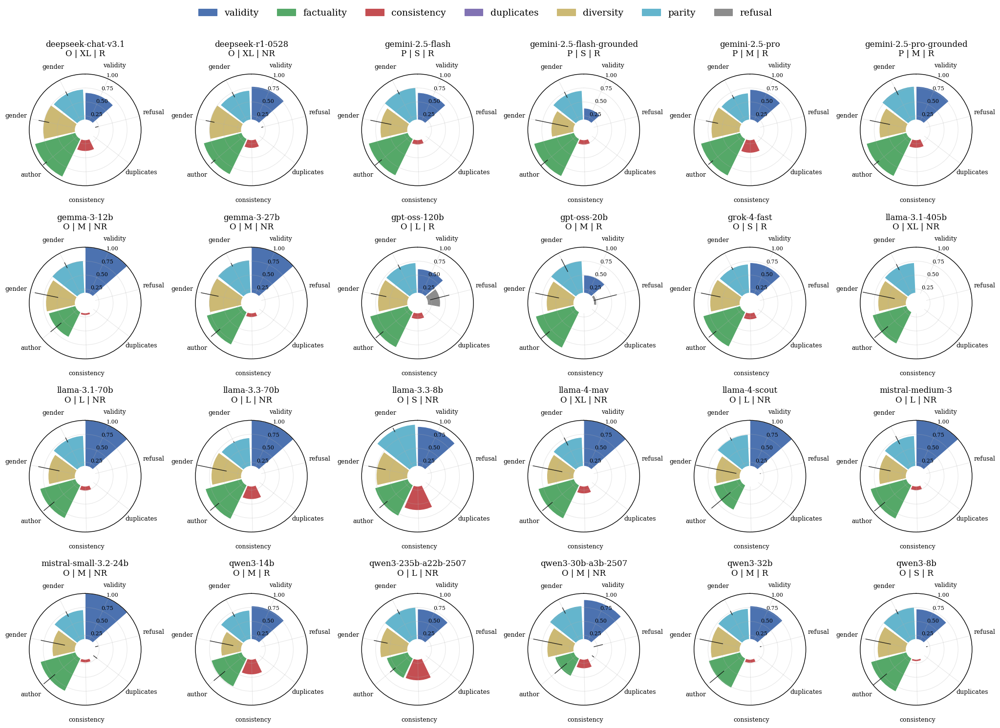

In [95]:
# ----------------------------
# Example usage
# ----------------------------
df_metrics = per_attempt_data.copy()

# Optional: enforce a global metric order across all panels
# order = ["validity", "refusal", "duplicates", "consistency", "author", "gender", "ethnicity", "prominence"]

# If you want a cleaner order, use metric_name values from your df, e.g.:
order = ["validity", "refusal", "duplicates", "consistency", "factuality", "diversity", "parity"]

# Define colors by metric_group (edit to match your groups exactly)
group_colors = {
            "validity": "#4C72B0",
            "factuality": "#55A868",
            "consistency": "#C44E52",
            "duplicates": "#8172B3",
            "diversity": "#CCB974",
            "parity": "#64B5CD",
            "refusal": "#8C8C8C",
        }

fig = plot_model_grid(
    df_metrics=df_metrics,
    df_meta=df_models_metadata,
    meta_cols={"model": "model_name", "access": "model_access", "size": "model_size", "class": "model_class"},
    ncols=6,
    order=order,               # or your explicit list
    group_colors=group_colors,
    figsize_per_cell=(4.2, 4.2),
)

fig.savefig(io.path_join(PLOTS_PATH, 'infrastructure_by_model.pdf'), dpi=300, bbox_inches='tight')

plt.show()
plt.close()
